Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
data.yaml in /content/data.yaml
start training 20 epoch.
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9c.pt, momentum=0.937

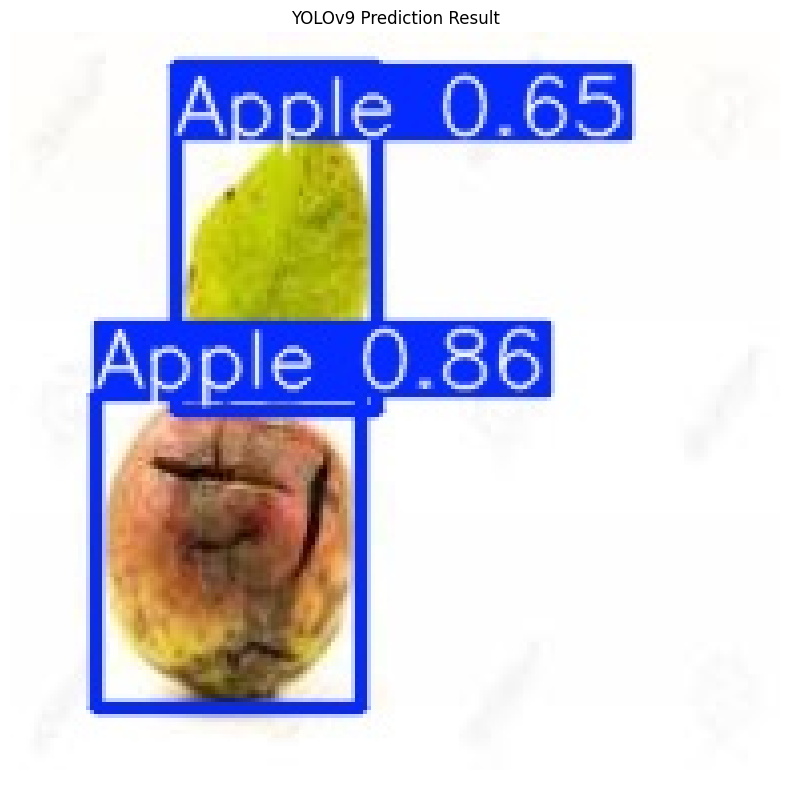


 Graph.
save: results.png -> /content/drive/MyDrive/Colab Notebooks/final/results.png
save: confusion_matrix.png -> /content/drive/MyDrive/Colab Notebooks/final/confusion_matrix.png
cant find: PR_curve.png

 Finish


In [ ]:
import os
import shutil
import glob
import random
import yaml
import torch
from google.colab import drive
from IPython.display import Image, display



!pip install ultralytics -q
from ultralytics import YOLO




drive.mount('/content/drive')

INPUT_PATH = "/content/drive/MyDrive/Colab Notebooks/final/archive.zip"
DATASET_ROOT = "/content/dataset_root"

if not os.path.exists(DATASET_ROOT):
    !unzip -n -q "{INPUT_PATH}" -d "{DATASET_ROOT}"
else:
    print("exist")

BASE_DIR = os.path.join(DATASET_ROOT, "Apple_Detection.v1i.yolov8")
TRAIN_IMG = os.path.join(BASE_DIR, "train", "images")
VALID_IMG = os.path.join(BASE_DIR, "valid", "images")

if not os.path.exists(VALID_IMG):
    print("no驗證集")
    VALID_IMG = TRAIN_IMG


yaml_content = {
    'path': BASE_DIR,
    'train': TRAIN_IMG,
    'val': VALID_IMG,
    'names': {0: 'Apple'}
}

yaml_path = '/content/data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(yaml_content, f)

print(f"data.yaml in {yaml_path}")


model = YOLO('yolov9c.pt')

print("start training 20 epoch.")

results = model.train(data=yaml_path, epochs=20, imgsz=640, plots=True)




map50 = results.box.map50
precision = results.box.mp
recall = results.box.mr

print(f"mAP50:     {map50:.2%}")
print(f"Precision :     {precision:.2%}")
print(f"Recall :        {recall:.2%}")
print("="*40)



test_images = glob.glob(os.path.join(TRAIN_IMG, "*.jpg"))
if len(test_images) == 0:
    test_images = glob.glob(os.path.join(TRAIN_IMG, "*.png"))

target_img = random.choice(test_images)

prediction_results = model.predict(target_img, save=True, conf=0.5)

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

predict_folders = sorted(glob.glob('runs/detect/predict*'), key=os.path.getmtime)
latest_folder = predict_folders[-1]
result_img_path = glob.glob(os.path.join(latest_folder, "*"))[0]

img = mpimg.imread(result_img_path)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.title("YOLOv9 Prediction Result")
plt.show()



best_model_path = os.path.join(results.save_dir, 'weights', 'best.pt')
drive_save_path = "/content/drive/MyDrive/Colab Notebooks/final/yolov9_apple_best_v2.pt"

shutil.copy(best_model_path, drive_save_path)



print("\n Graph.")

graphs_to_save = ['results.png', 'confusion_matrix.png', 'PR_curve.png']
drive_folder = "/content/drive/MyDrive/Colab Notebooks/final/"

for graph_name in graphs_to_save:
    src_path = os.path.join(results.save_dir, graph_name)

    if os.path.exists(src_path):
        dst_path = os.path.join(drive_folder, graph_name)
        shutil.copy(src_path, dst_path)
        print(f"save: {graph_name} -> {dst_path}")
    else:
        print(f"cant find: {graph_name}")

print("\n Finish")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


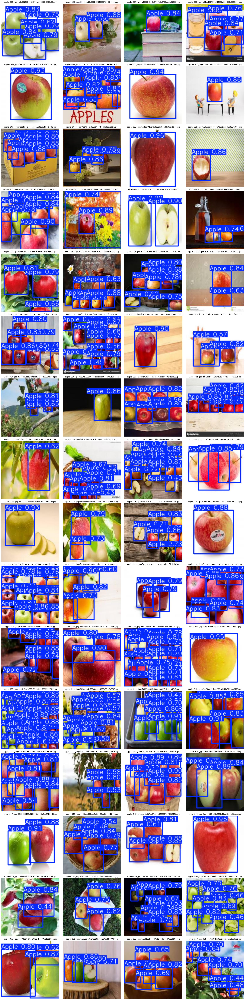

finish


In [ ]:
import os
import glob
import matplotlib.pyplot as plt
import cv2
import math
from ultralytics import YOLO
from google.colab import drive


drive.mount('/content/drive')


model = YOLO("/content/drive/MyDrive/Colab Notebooks/final/yolov9_apple_best_v2.pt")

valid_path = "/content/dataset_root/Apple_Detection.v1i.yolov8/valid/images"
image_paths = glob.glob(os.path.join(valid_path, "*.jpg")) + glob.glob(os.path.join(valid_path, "*.png"))


image_paths.sort()
selected_imgs = image_paths[:64]



results = model.predict(selected_imgs, conf=0.4, verbose=False)


cols = 4
rows = math.ceil(len(selected_imgs) / cols)

plt.figure(figsize=(20, 5 * rows))

for i, result in enumerate(results):

    res_plotted = result.plot()
    img_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(os.path.basename(result.path), fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

print("finish")